 # Nettoyage des données Open Food Facts

<a id='sec:Preambule'></a>
# Préambule 

Dans ce notebook, nous allons traiter le jeu de données Open Food Facts et proposer une idée d'application pour l'appel à projets de l'agence "Santé publique France". La première étape consiste à effectuer une analyse exploratoire des données et nettoyer les données en identifiant les valeurs manquantes et aberrantes. Nous écrirons également des fonctions pour automatiser ces tâches de nettoyage.

## Table des Matières
*  [Préambule](#sec:Preambule)
*  [Pré-analyse des jeux de données](#sec:PreanalyseDesJeuxDeDonnees)
*  [Exploration des données Open Food Facts](#sec:ExplorationdesdonnéesOpenFoodFacts)
*  [Calcul de l'indice écologique en fonction des pays et du type d'emballage](#sec:Calculdelindiceecologique)
*  [Nettoyage des données](#sec:Nettoyagedesdonnées)
 * [Mapping de données](#subsec:Mappingdedonnées)
 * [Méthode KNN](#subsec:MéthodeKNN)
 * [Imputation des données manquantes](#subsec:Imputationdesdonnéesmanquantes)
 * [Régression Linéaire](#subsec:RégressionLinéaire)
*  [Conclusion et perspectives](#sec:ConclusionEtPerspectives)

<a id='sec:PreanalyseDesJeuxDeDonnees'></a>
# Pré-analyse des jeux de données

Dans cette première étape, nous allons analyser le jeu de données Open Food Facts et comprendre la structure des données. Nous allons également repérer les variables pertinentes pour notre idée d'application. Nous allons utiliser les bibliothèques pandas et numpy pour cette analyse exploratoire des données.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
import importlib.metadata
import difflib
import scipy.stats as stats

In [2]:
import plotly.express as px
import plotly.figure_factory as ff
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import chart_studio.plotly as py
import cufflinks as cf 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# For Notebooks
init_notebook_mode(connected=True)
# For offline use
cf.go_offline()
%matplotlib inline

In [3]:
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', None)

In [4]:
!python --version

# Version des librairies utilisées
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

print("matplotlib - ", importlib.metadata.version('matplotlib'))

Python 3.8.3
pandas - 1.3.4
numpy - 1.22.4
seaborn - 0.12.1
missingno - 0.4.2
cufflinks - 0.17.3
matplotlib -  3.6.2


<a id='sec:PreanalyseDesJeuxDeDonnees'></a>
# Pré-analyse des jeux de données

Dans cette section, je vais effectuer une pré-analyse des jeux de données pour comprendre les données en termes de leur qualité, de leur taille, des variables et des types de données qu'elles contiennent.



In [5]:
# Charger le jeu de données

df = pd.read_csv('fropenfoodfactsorgproducts.csv', delimiter='\t', low_memory=False)

display(df.head(5))



,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"en:to-be-completed, en:nutrition-facts-to-be-completed, en:ingredients-to-be-completed, en:expiration-date-to-be-completed, en:characteristics-to-be-completed, en:categories-to-be-completed, en:brands-completed, en:packaging-to-be-completed, en:quantity-completed, en:product-name-completed, en:photos-to-be-validated, en:photos-uploaded","en:to-be-completed,en:nutrition-facts-to-be-completed,en:ingredients-to-be-completed,en:expiration-date-to-be-completed,en:characteristics-to-be-completed,en:categories-to-be-completed,en:brands-completed,en:packaging-to-be-completed,en:quantity-completed,en:product-name-completed,en:photos-to-be-validated,en:photos-uploaded","A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,

Le premier code permet d'afficher toutes les colonnes du DataFrame sans limitation de nombre. Le second code permet de parcourir toutes les colonnes du DataFrame et d'afficher leurs noms. Cela nous permet de visualiser rapidement toutes les colonnes du DataFrame, ce qui peut être utile pour comprendre les données que nous manipulons dans le cadre du projet Open Food Facts.

In [6]:
pd.set_option('display.max_columns', None)
#Cette ligne permet d'afficher toutes les colonnes d'un dataframe sans les limiter à un nombre fixe.
for i in range(162):
    print(df.columns.to_list()[i])
#Ce code permet d'imprimer la liste des colonnes du dataframe df.

code
url
creator
created_t
created_datetime
last_modified_t
last_modified_datetime
product_name
generic_name
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
origins
origins_tags
manufacturing_places
manufacturing_places_tags
labels
labels_tags
labels_fr
emb_codes
emb_codes_tags
first_packaging_code_geo
cities
cities_tags
purchase_places
stores
countries
countries_tags
countries_fr
ingredients_text
allergens
allergens_fr
traces
traces_tags
traces_fr
serving_size
no_nutriments
additives_n
additives
additives_tags
additives_fr
ingredients_from_palm_oil_n
ingredients_from_palm_oil
ingredients_from_palm_oil_tags
ingredients_that_may_be_from_palm_oil_n
ingredients_that_may_be_from_palm_oil
ingredients_that_may_be_from_palm_oil_tags
nutrition_grade_uk
nutrition_grade_fr
pnns_groups_1
pnns_groups_2
states
states_tags
states_fr
main_category
main_category_fr
image_url
image_small_url
energy_100g
energy-from-fat_100g
fat_100g
saturated-fat_100g
butyr

Ce code nous permet de visualiser les colonnes du DataFrame qui ont le plus grand pourcentage de valeurs non nulles, ce qui peut nous aider à identifier les variables les plus pertinentes pour notre analyse dans le projet Open Food Facts.

In [7]:
(df.count() / len(df) * 100).sort_values(ascending=False)[:50].iplot(kind='bar')



Ce code calcule le pourcentage de valeurs non nulles pour chaque colonne d'un DataFrame et les affiche dans l'ordre décroissant de leur complétude.
Ce code peut nous aider à comprendre rapidement quelles colonnes ont le plus de données manquantes et nous permettre de planifier notre analyse en conséquence.

In [8]:
completeness= (df.count() /len(df) *100).sort_values(ascending=False)
#Print percentage of each column that is filled
for col in completeness.index:
    print(f"{col}: {completeness[col]:.2f}%")

last_modified_t: 100.00%
last_modified_datetime: 100.00%
creator: 100.00%
created_t: 100.00%
created_datetime: 100.00%
code: 99.99%
url: 99.99%
states_fr: 99.99%
states_tags: 99.99%
states: 99.99%
countries: 99.91%
countries_fr: 99.91%
countries_tags: 99.91%
product_name: 94.46%
brands: 91.14%
brands_tags: 91.14%
energy_100g: 81.40%
proteins_100g: 81.03%
salt_100g: 79.65%
sodium_100g: 79.64%
ingredients_text: 77.61%
ingredients_that_may_be_from_palm_oil_n: 77.61%
ingredients_from_palm_oil_n: 77.61%
additives_n: 77.61%
additives: 77.60%
sugars_100g: 76.37%
fat_100g: 76.03%
carbohydrates_100g: 75.94%
saturated-fat_100g: 71.56%
nutrition_grade_fr: 68.96%
nutrition-score-fr_100g: 68.96%
nutrition-score-uk_100g: 68.96%
serving_size: 65.88%
fiber_100g: 62.63%
additives_fr: 48.22%
additives_tags: 48.22%
cholesterol_100g: 44.92%
trans-fat_100g: 44.67%
calcium_100g: 43.97%
vitamin-c_100g: 43.91%
iron_100g: 43.79%
vitamin-a_100g: 42.88%
quantity: 32.68%
pnns_groups_2: 29.46%
pnns_groups_1: 28.53

In [9]:
display(df.shape)

(320772, 162)

Le jeu de données Open Food Facts comprend un total de 162 colonnes de données et 320 772 lignes de données. Chaque entrée du jeu de données fournit des informations sur un produit spécifique. Lorsqu'on analyse le taux de remplissage des données, on constate que les informations relatives à la date de création et de dernière modification du produit, le code-barres, le lien vers le site web ainsi que les notes sur les colonnes associées aux données manquantes ou complétées concernant le produit et les pays dans lesquels il est vendu sont renseignées à hauteur de 99%. Les colonnes suivantes portent sur le nom et la marque du produit, les informations nutritionnelles et la présence d'allergènes ou d'additifs dans le produit.

In [10]:
# Ce code supprime les colonnes qui ont moins de 0,1 % de valeurs non nulles.
for col in completeness.index:
    if completeness[col] < 0.1:
        del df[col]

 Cela nous permet de travailler avec un ensemble de données plus petit et plus cohérent.

In [11]:
display(df.shape)

(320772, 101)

61 colonnes ont été supprimées, ce qui représente environ 37,7% des colonnes d'origine. Cette réduction significative de la taille du DataFrame peut être bénéfique pour l'analyse de données, car elle permet de se concentrer sur les variables les plus pertinentes et d'éviter le bruit inutile causé par des colonnes avec très peu de données disponibles.

In [12]:
for col in df.columns:
    display(f"{col}: {df[col].dtype}")

'code: object'

'url: object'

'creator: object'

'created_t: object'

'created_datetime: object'

'last_modified_t: object'

'last_modified_datetime: object'

'product_name: object'

'generic_name: object'

'quantity: object'

'packaging: object'

'packaging_tags: object'

'brands: object'

'brands_tags: object'

'categories: object'

'categories_tags: object'

'categories_fr: object'

'origins: object'

'origins_tags: object'

'manufacturing_places: object'

'manufacturing_places_tags: object'

'labels: object'

'labels_tags: object'

'labels_fr: object'

'emb_codes: object'

'emb_codes_tags: object'

'first_packaging_code_geo: object'

'cities_tags: object'

'purchase_places: object'

'stores: object'

'countries: object'

'countries_tags: object'

'countries_fr: object'

'ingredients_text: object'

'allergens: object'

'traces: object'

'traces_tags: object'

'traces_fr: object'

'serving_size: object'

'additives_n: float64'

'additives: object'

'additives_tags: object'

'additives_fr: object'

'ingredients_from_palm_oil_n: float64'

'ingredients_from_palm_oil_tags: object'

'ingredients_that_may_be_from_palm_oil_n: float64'

'ingredients_that_may_be_from_palm_oil_tags: object'

'nutrition_grade_fr: object'

'pnns_groups_1: object'

'pnns_groups_2: object'

'states: object'

'states_tags: object'

'states_fr: object'

'main_category: object'

'main_category_fr: object'

'image_url: object'

'image_small_url: object'

'energy_100g: float64'

'energy-from-fat_100g: float64'

'fat_100g: float64'

'saturated-fat_100g: float64'

'monounsaturated-fat_100g: float64'

'polyunsaturated-fat_100g: float64'

'omega-3-fat_100g: float64'

'trans-fat_100g: float64'

'cholesterol_100g: float64'

'carbohydrates_100g: float64'

'sugars_100g: float64'

'polyols_100g: float64'

'fiber_100g: float64'

'proteins_100g: float64'

'salt_100g: float64'

'sodium_100g: float64'

'alcohol_100g: float64'

'vitamin-a_100g: float64'

'vitamin-d_100g: float64'

'vitamin-e_100g: float64'

'vitamin-k_100g: float64'

'vitamin-c_100g: float64'

'vitamin-b1_100g: float64'

'vitamin-b2_100g: float64'

'vitamin-pp_100g: float64'

'vitamin-b6_100g: float64'

'vitamin-b9_100g: float64'

'folates_100g: float64'

'vitamin-b12_100g: float64'

'biotin_100g: float64'

'pantothenic-acid_100g: float64'

'potassium_100g: float64'

'calcium_100g: float64'

'phosphorus_100g: float64'

'iron_100g: float64'

'magnesium_100g: float64'

'zinc_100g: float64'

'copper_100g: float64'

'manganese_100g: float64'

'selenium_100g: float64'

'fruits-vegetables-nuts_100g: float64'

'cocoa_100g: float64'

'nutrition-score-fr_100g: float64'

'nutrition-score-uk_100g: float64'

In [13]:
df.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,polyols_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,potassium_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,selenium_100g,fruits-vegetables-nuts_100g,cocoa_100g,nutrition-score-fr_100g,nutrition-score-uk_100g
count,248939.000000,248939.000000,248939.000000,2.611130e+05,857.000000,243891.000000,229554.000000,22823.000000,22859.000000,841.000000,143298.000000,144090.000000,243588.000000,244971.000000,414.000000,200886.000000,259922.000000,255510.000000,255463.000000,4133.000000,137554.000000,7057.000000,1340.000000,918.000000,140867.000000,11154.000000,10815.000000,11729.000000,6784.000000,5240.000000,3042.000000,5.300000e+03,330.000000,2483.000000,24748.000000,141050.000000,5845.000000,140462.000000,6253.000000,3929.000000,2106.000000,1620.000000,1168.000000,3036.000000,948.000000,221210.000000,221210.000000
mean,1.936024,0.019659,0.055246,1.141915e+03,585.501214,12.730379,5.129932,10.425055,6.312493,3.182103,0.073476,0.020071,32.073981,16.003484,49.790389,2.862111,7.075940,2.028624,0.798815,7.838105,0.000397,0.000008,0.056705,0.034219,0.023367,0.325574,0.259007,0.020303,0.023378,0.006898,0.205856,8.938696e-05,0.121290,0.072138,0.424635,0.125163,0.617282,0.003652,0.534143,0.007950,0.025794,0.003014,0.003126,31.458587,49.547785,9.165535,9.058049
std,2.502019,0.140524,0.269207,6.447154e+03,712.809943,17.578747,8.014238,17.076167,10.832591,5.607988,1.540223,0.358062,29.731719,22.327284,33.212338,12.867578,8.409054,128.269454,50.504428,10.959671,0.073278,0.000360,0.694039,1.031398,2.236451,2.474306,1.277026,0.339262,1.206822,0.335163,5.132250,5.514738e-03,0.737912,1.475120,12.528768,3.318263,12.058090,0.214408,13.498653,0.080953,0.914247,0.028036,0.104503,31.967918,18.757932,9.055903,9.183589
min,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.570000,0.000000,0.000000,-17.860000,0.000000,-6.700000,-800.000000,0.000000,0.000000,0.000000,-0.000340,0.000000,0.000000,0.000000,-0.002100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,-2.000000,-2.000000,0.000000,0.000000,0.000000,-0.000260,0.000000,0.000000,-6.896552,0.000000,-0.000002,0.000000,6.000000,-15.000000,-15.000000
25%,0.000000,0.000000,0.000000,3.770000e+02,49.400000,0.000000,0.000000,0.000000,0.000000,0.600000,0.000000,0.000000,6.000000,1.300000,18.350000,0.000000,0.700000,0.063500,0.025000,0.000000,0.000000,0.000001,0.001800,0.000006,0.000000,0.004000,0.002720,0.003077,0.000255,0.000030,0.000042,7.200000e-07,0.000006,0.000417,0.107000,0.000000,0.094000,0.000000,0.021000,0.001150,0.000177,0.000000,0.000005,0.000000,32.000000,1.000000,1.000000
50%,1.000000,0.000000,0.000000,1.100000e+03,300.000000,5.000000,1.790000,4.000000,2.220000,1.800000,0.000000,0.000000,20.600000,5.710000,59.750000,1.500000,4.760000,0.581660,0.229000,5.000000,0.000000,0.000001,0.005200,0.000025,0.000000,0.012000,0.014167,0.005357,0.000700,0.000052,0.000114,1.920000e-06,0.000014,0.001639,0.180000,0.035000,0.206000,0.001010,0.075000,0.003700,0.000417,0.001000,0.000022,23.000000,50.000000,10.000000,9.000000
75%,3.000000,0.000000,0.000000,1.674000e+03,898.000000,20.000000,7.140000,10.710000,7.140000,3.200000,0.000000,0.020000,58.330000,24.000000,70.000000,3.600000,10.000000,1.374140,0.541000,12.000000,0.000107,0.000003,0.012000,0.000100,0.003700,0.402000,0.300000,0.009091,0.001500,0.000070,0.000214,4.690000e-06,0.000041,0.004167,0.341000,0.106000,0.357000,0.002400,0.141000,0.007500,0.00100

Le résumé statistique (df.describe()) des données numériques a révélé des valeurs atypiques en dehors de la plage attendue de 0 à 100 grammes pour certaines colonnes de données de nutrition. Ces valeurs doivent être examinées et traitées avec soin pour éviter d'influencer négativement les résultats de notre analyse.

Nous sélectionnons toutes les colonnes de type numérique dans le dataframe à l'aide de la méthode .select_dtypes(). Nous stockons ensuite ces colonnes dans la variable numeric_cols.

Nous avons remarqué que certaines colonnes numériques ont des valeurs en dehors de la plage attendue de 0 à 100, ce qui pourrait affecter négativement nos analyses. Nous ne voulons garder que les colonnes qui ont des valeurs en grammes (100g), mais nous ne voulons pas inclure les colonnes d'énergie, de score nutritionnel et d'empreinte carbone dans notre analyse.

Nous avons créé une liste de colonnes à conserver (cols_to_keep) en utilisant les méthodes .str.endswith(), .str.contains() et ~ (négation) sur la variable numeric_cols.

Après cette analyse, j'ai remarqué la présence de valeurs aberrantes en dehors de la plage de 0 à 100 pour les colonnes de données qui indiquent les grammes pour chaque catégorie de nutrition. Pour résoudre ce problème, j'ai créé un masque booléen pour identifier les lignes ayant des valeurs en dehors de la plage 0-100 et j'ai supprimé ces lignes du dataframe.

In [14]:
numeric_cols = df.select_dtypes(include='number').columns
cols_to_keep = numeric_cols[numeric_cols.str.endswith('100g') 
                            & ~numeric_cols.str.contains('energy')
                            & ~numeric_cols.str.contains('nutrition-score') 
                            & ~numeric_cols.str.contains('carbon-footprint')]
display(cols_to_keep)

Index(['fat_100g', 'saturated-fat_100g', 'monounsaturated-fat_100g',
       'polyunsaturated-fat_100g', 'omega-3-fat_100g', 'trans-fat_100g',
       'cholesterol_100g', 'carbohydrates_100g', 'sugars_100g', 'polyols_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'alcohol_100g', 'vitamin-a_100g', 'vitamin-d_100g', 'vitamin-e_100g',
       'vitamin-k_100g', 'vitamin-c_100g', 'vitamin-b1_100g',
       'vitamin-b2_100g', 'vitamin-pp_100g', 'vitamin-b6_100g',
       'vitamin-b9_100g', 'folates_100g', 'vitamin-b12_100g', 'biotin_100g',
       'pantothenic-acid_100g', 'potassium_100g', 'calcium_100g',
       'phosphorus_100g', 'iron_100g', 'magnesium_100g', 'zinc_100g',
       'copper_100g', 'manganese_100g', 'selenium_100g',
       'fruits-vegetables-nuts_100g', 'cocoa_100g'],
      dtype='object')

In [15]:
outliers_count = ((df[cols_to_keep] < 0) | (df[cols_to_keep] > 100)).sum().sort_values(ascending=False)
outliers_count = outliers_count[outliers_count != 0]
display(outliers_count)

salt_100g                   158
sodium_100g                  34
carbohydrates_100g           19
sugars_100g                  19
calcium_100g                 10
trans-fat_100g                9
biotin_100g                   8
pantothenic-acid_100g         8
magnesium_100g                6
fiber_100g                    5
phosphorus_100g               5
fat_100g                      4
proteins_100g                 4
vitamin-c_100g                4
saturated-fat_100g            3
folates_100g                  3
potassium_100g                2
iron_100g                     1
copper_100g                   1
selenium_100g                 1
vitamin-b1_100g               1
monounsaturated-fat_100g      1
vitamin-a_100g                1
dtype: int64

In [16]:
mask = ((df[cols_to_keep] < 0) | (df[cols_to_keep] > 100)).any(axis=1)

df = df[~mask]

In [17]:
display(df.shape)

(320526, 101)

Code pour détecter les valeurs aberrantes dans les colonnes numériques d'un ensemble de données. Il utilise les scores Z pour mesurer la distance entre chaque valeur et la moyenne de la colonne, et fixe un seuil de 3 pour identifier les valeurs aberrantes.

In [18]:
numeric_cols = df.select_dtypes(include='number').columns
outliers_counts = {}


for col in numeric_cols:
    z_scores = stats.zscore(df[~np.isnan(df[col])][col])

    outliers_counts[col] = np.sum(z_scores > 3)
    
outliers_counts = pd.Series(outliers_counts)
outliers_counts

additives_n                                 4245
ingredients_from_palm_oil_n                 4833
ingredients_that_may_be_from_palm_oil_n    11694
energy_100g                                    7
energy-from-fat_100g                          25
fat_100g                                    5250
saturated-fat_100g                          2670
monounsaturated-fat_100g                    1165
polyunsaturated-fat_100g                     680
omega-3-fat_100g                              18
trans-fat_100g                               966
cholesterol_100g                              11
carbohydrates_100g                             0
sugars_100g                                 4487
polyols_100g                                   0
fiber_100g                                  3281
proteins_100g                               3399
salt_100g                                   2851
sodium_100g                                 2851
alcohol_100g                                  65
vitamin-a_100g      

Les colonnes contenant des données numériques ne suivent pas une distribution normale. Ainsi, une analyse en z-matrix peut nous tromper. Les informations dans chaque colonne sont basées sur les valeurs nutritionnelles de produits spécifiques. Cependant, la colonne energy_100g a été examinée plus attentivement car elle prend des valeurs assez élevées

In [19]:
df[df['energy_100g'].values>4200][['energy_100g','product_name']].sort_values(by='energy_100g',ascending=False)

,energy_100g,product_name
212928,3251373.0,Pois cassés
249101,182764.0,"Légume Noisettes Carottes, 500 Grammes, Marque Iglo"
119184,94140.0,"Sophia, Italian Drink, Squeezed Lime"
317171,87217.0,NaN
219302,69292.0,NaN
153704,26861.0,Salsa Hot Sauce
176697,22000.0,bubbly
181668,16000.0,NaN
223318,15481.0,Huiles vierge biologique de Colza - première pression à froid
46967,14644.0,Instant Aka Miso Soup


Les valeurs de energy_100g ne correspondent pas aux noms des produits et celles qui sont au-dessus des valeurs sont extrêmement élevées. C'est pourquoi elles devraient être supprimées des ensembles de données.

In [20]:
df[df['energy_100g'].values>4200][['energy_100g','product_name']].sort_values(by='energy_100g',ascending=False).index[:].to_list()

[212928,
 249101,
 119184,
 317171,
 219302,
 153704,
 176697,
 181668,
 223318,
 46967,
 115777,
 35308,
 290157,
 80439,
 66156,
 20070,
 178787,
 275516,
 224442,
 268346,
 119387,
 295016,
 311783,
 296406,
 286690,
 218448,
 250717,
 142141,
 114969,
 27849,
 104932,
 240071,
 35366,
 35372,
 219497,
 131974,
 35143,
 274490,
 210322,
 229618,
 229737,
 207590,
 264409,
 254093,
 285082,
 277872,
 279912,
 319695,
 193248,
 255845,
 215679,
 254078,
 305223,
 272908,
 188751,
 5440,
 260589,
 313852,
 199505,
 251673,
 240015,
 241696,
 55878,
 133635,
 93949,
 93950,
 241477,
 189640,
 128259,
 15660,
 252865,
 188938,
 219504,
 204923,
 184758,
 213511,
 222738,
 199683,
 236513,
 242099,
 56561,
 183135,
 214697,
 187381,
 245024,
 199480,
 247152,
 179586,
 304297,
 277678,
 55852,
 27587,
 231858,
 293188,
 100992,
 100993,
 256886,
 108464,
 168081,
 181199,
 320561,
 246581,
 120286,
 772,
 236013,
 208805,
 218736,
 237814,
 181503,
 108392,
 14399,
 108364,
 96624,
 16761

Code pour supprimer certaines lignes du DataFrame "df" qui contiennent des valeurs aberrantes ou des erreurs potentielles qui ne correspondent pas bien aux données.

In [21]:
df.drop(df[df['energy_100g'].values>4200][['energy_100g','product_name']]\
        .sort_values(by='energy_100g',ascending=False).index[:].to_list(), axis=0, inplace=True)


<a id='sec:ExplorationdesdonnéesOpenFoodFacts'></a>
# Exploration des données Open Food Facts

Nous avons effectué une exploration des données Open Food Facts pour comprendre la distribution des données, les relations entre les caractéristiques et les valeurs manquantes.Cette approche permet d'identifier les colonnes similaires et de comprendre comment les similitudes sont réparties à différentes proportions. En outre, les colonnes de données incorrectes ou peu claires peuvent être corrigées pour une meilleure compréhension globale du jeu de données.

Tout d'abord, examinons les colonnes qui fournissent des informations sur les dates.

In [22]:
df[['created_t', 'created_datetime','last_modified_t', 'last_modified_datetime']]

,created_t,created_datetime,last_modified_t,last_modified_datetime
0,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z
1,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z
2,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z
3,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z
4,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z
...,...,...,...,...
320767,1490631299,2017-03-27T16:14:59Z,1491244498,2017-04-03T18:34:58Z
320768,1489059076,2017-03-09T11:31:16Z,1491244499,2017-04-03T18:34:59Z
320769,1422099377,2015-01-24T11:36:17Z,1491244499,2017-04-03T18:34:59Z
320770,1492340089,2017-04-16T10:54:49Z,1492340089,2017-04-16T10:54:49Z


Ces colonnes de données sont similaires. L'une d'entre elles qui se termine par _t appartient au format de horodatage UNIX et l'autre colonne (_datetime) est écrite dans le format iso8601.

In [23]:
pd.to_datetime(df['created_datetime'],errors='coerce').dt.year.sort_values(ascending=False).value_counts()

2017.0    209064
2016.0     47495
2015.0     35615
2014.0     13547
2013.0     10159
2012.0      4508
Name: created_datetime, dtype: int64

Le code utilise la méthode to_datetime() pour convertir la colonne 'created_datetime' en un objet datetime, en ignorant les valeurs invalides (errors='coerce'). Ensuite, il extrait l'année de chaque date avec la méthode dt.year et les trie par ordre décroissant. Nous pouvons voir que la majorité des données ont été créées en 2017, avec 209 161 entrées

In [24]:
pd.to_datetime(df['created_datetime'],errors='coerce').dt.year.sort_values(ascending=False)\
                                    .value_counts().iplot(kind='bar')

Ces résultats peuvent aider à comprendre la distribution temporelle des données dans notre ensemble de données et nous donner une indication de l'évolution de la quantité de données collectées au fil du temps.

En ce qui concerne les données nutritionnelles, chaque valeur de produit contient une note de nutrition. Cependant, il y a un grand nombre de données manquantes. Nous pouvons nommer ces données manquantes "Unknown" et créer un histogramme pour mieux les visualiser.

In [25]:
#La première ligne de code crée une catégorie pour la colonne 'nutrition_grade_fr' 
#qui est ordonnée selon les grades nutritionnels 'a', 'b', 'c', 'd', et 'e'.
df['nutrition_grade_fr'] = pd.Categorical(df['nutrition_grade_fr'], categories=['a', 'b', 'c', 'd', 'e'], ordered=True)
#ajoute la catégorie 'Unknown' à la colonne 'nutrition_grade_fr'.
df['nutrition_grade_fr'] = df['nutrition_grade_fr'].cat.add_categories(['Unknown'])
#remplit les valeurs manquantes de la colonne 'nutrition_grade_fr' avec la catégorie 'Unknown'.
df['nutrition_grade_fr'] = df['nutrition_grade_fr'].fillna('Unknown')

#la liste de couleurs est créée pour chaque grade nutritionnel, allant de 'darkgreen' pour 'a' à 'gray' pour 'Unknown'.
colors = ['darkgreen', 'lightgreen', 'yellow', 'orange', 'red', 'gray']

fig = px.histogram(df, x='nutrition_grade_fr', color='nutrition_grade_fr', category_orders=dict(nutrition_grade_fr=["a", "b", "c", "d","e","Unknown"]),
                   nbins=5, color_discrete_sequence=colors)

fig.show()



Environ 100 000 valeurs du nutrition_grade_fr ne sont pas connues. Cela représente environ 31% de la taille totale de la colonne. Je vais essayer de prédire ce grade nutritionnel manquant dans la prochaine sous-section.

In [26]:
print("{:.2f}".format(len(df[df['nutrition_grade_fr']=='Unknown'])/len(df['nutrition_grade_fr'])))


0.31


In [27]:
df['nutrition_grade_fr'].value_counts(normalize=True)

Unknown    0.310240
d          0.195725
c          0.141993
e          0.134015
a          0.111172
b          0.106856
Name: nutrition_grade_fr, dtype: float64

Ce code crée une grille de 4x2 de graphiques à barres, où chaque graphique représente les valeurs moyennes d'une variable nutritionnelle (par exemple, énergie, gras, sucre) pour chaque catégorie de notation nutritionnelle (par exemple, A, B, C, D, E). Les noms de colonnes correspondant à ces variables sont stockés dans la liste column_names.

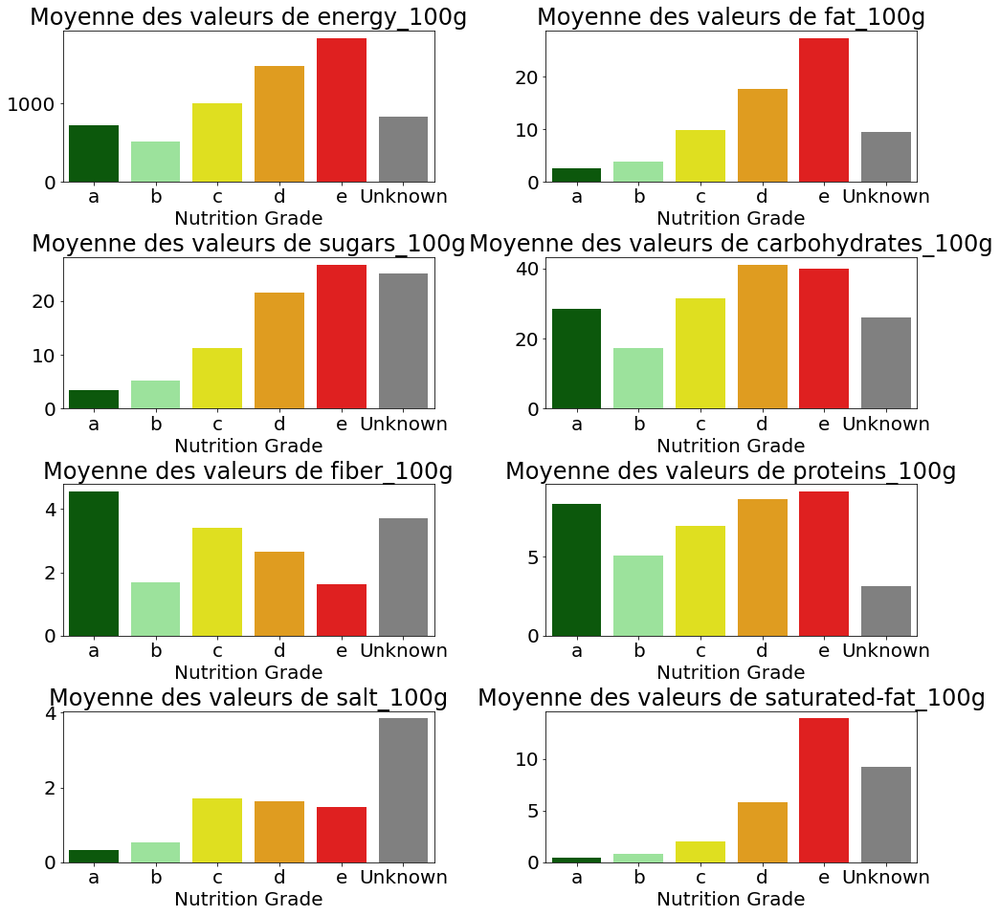

In [28]:
#Définition des noms de colonnes
column_names = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'saturated-fat_100g']

# Création d'une matrice de sous-graphiques 4x2
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 16),gridspec_kw={"hspace": 0.5, "wspace": 0.3})

# Aplatir la matrice des sous-graphiques pour itérer sur les sous-graphiques
axes = axes.flatten()

#Obtention des catégories principales pour le tri des données
categories = df['nutrition_grade_fr'].value_counts().index.tolist()

# Itérer sur les colonnes et dessiner les graphiques dans chaque sous-graphique
for i, col in enumerate(column_names):
    # Obtenir les scores moyens par catégorie pour la colonne actuelle
    grouped_scores = df[df['nutrition_grade_fr'].isin(categories)].groupby('nutrition_grade_fr')[col].mean()
    
    # Dessiner le graphique pour la colonne actuelle
    sns.barplot(x=grouped_scores.index, y=grouped_scores.values, palette=colors, ax=axes[i])
    axes[i].set_title(f"Moyenne des valeurs de {col}",fontsize=24)
    axes[i].tick_params(axis='both', which='major', labelsize=20)
    axes[i].set_xlabel('Nutrition Grade', fontsize=20)





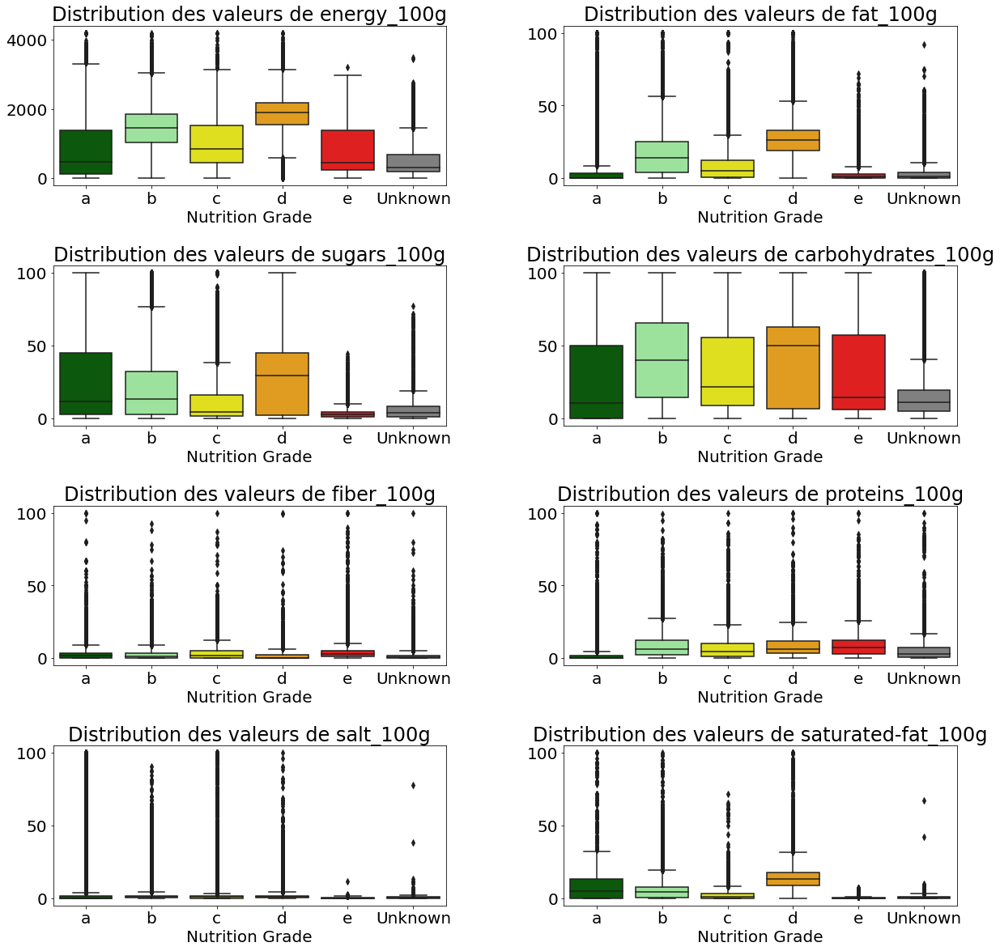

In [29]:
#Définition des noms de colonnes
column_names = ['energy_100g', 'fat_100g', 'sugars_100g', 'carbohydrates_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'saturated-fat_100g']

# Création d'une matrice de sous-graphiques 4x2
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 20), gridspec_kw={"hspace": 0.5, "wspace": 0.3})

# Aplatir la matrice des sous-graphiques pour itérer sur les sous-graphiques
axes = axes.flatten()
tick_labels = ['a', 'b', 'c', 'd', 'e', 'Unknown']

#Obtention des catégories principales pour le tri des données
categories = df['nutrition_grade_fr'].value_counts().index.tolist()

# Itérer sur les colonnes et dessiner les graphiques dans chaque sous-graphique
for i, col in enumerate(column_names):
    # Obtenir les données pour la colonne actuelle
    data = [df.loc[df['nutrition_grade_fr'] == cat, col].values for cat in categories]
    
    # Dessiner le graphique pour la colonne actuelle
    sns.boxplot(data=data, palette=colors, ax=axes[i])
    axes[i].set_title(f"Distribution des valeurs de {col}", fontsize=24)
    axes[i].tick_params(axis='both', which='major', labelsize=20)
    axes[i].set_xlabel('Nutrition Grade', fontsize=20)
    axes[i].set_xticklabels(tick_labels)


Comme on peut le voir sur le graphique en boîte ci-dessus, les valeurs de nutrition sous la catégorisation de la note nutritionnelle ne respectent pas complètement chaque note. Nous ne pouvons pas les classer en fonction d'une valeur spécifique parmi ces valeurs nutritionnelles. Il y a de nombreuses valeurs d'énergie en dehors de la boîte pour les aliments étiquetés "D". Il en va de même pour les valeurs de matières grasses. Cependant, les valeurs de glucides sont bien classées en fonction de la note nutritionnelle. Les valeurs de sel ne respectent pas non plus pleinement la note nutritionnelle.

Nous examinons maintenant les données de texte contenant des chaînes de caractères après avoir traité les données numériques et catégorielles. Les colonnes "main_category", "categories" et "labels" contiennent des informations textuelles sur les produits.

In [30]:
df['main_category'].value_counts()

en:beverages                          6051
en:groceries                          2901
en:chocolates                         2786
en:plant-based-foods-and-beverages    2744
en:canned-foods                       2519
                                      ... 
fr:anchoiade                             1
fr:creme-de-riz                          1
fr:creme-de-sarrasin                     1
en:crackers-sans-gluten                  1
pl:szprot                                1
Name: main_category, Length: 3542, dtype: int64

L'abréviation de la langue est présente sur chaque ligne de données de la colonne main_category. Elle peut être supprimée à l'aide de cette méthode.

In [31]:
df['main_category'] = df['main_category'].apply(lambda x: x.split(':')[1] if (pd.notnull(x)) and (':' in x) else x)


In [32]:
df['main_category'].value_counts()

beverages                          6051
groceries                          2901
chocolates                         2786
plant-based-foods-and-beverages    2744
canned-foods                       2519
                                   ... 
boeuf-marine                          1
entrees-surgelees                     1
quiches-lorraines                     1
poudre-cacaotee                       1
szprot                                1
Name: main_category, Length: 3376, dtype: int64

In [33]:
df['main_category_fr'].value_counts()

Boissons                                   6051
Epicerie                                   2901
Chocolats                                  2786
Aliments et boissons à base de végétaux    2744
Conserves                                  2519
                                           ... 
Anchoiade                                     1
Creme-de-riz                                  1
Creme-de-sarrasin                             1
en:Crackers-sans-gluten                       1
pl:Szprot                                     1
Name: main_category_fr, Length: 3542, dtype: int64

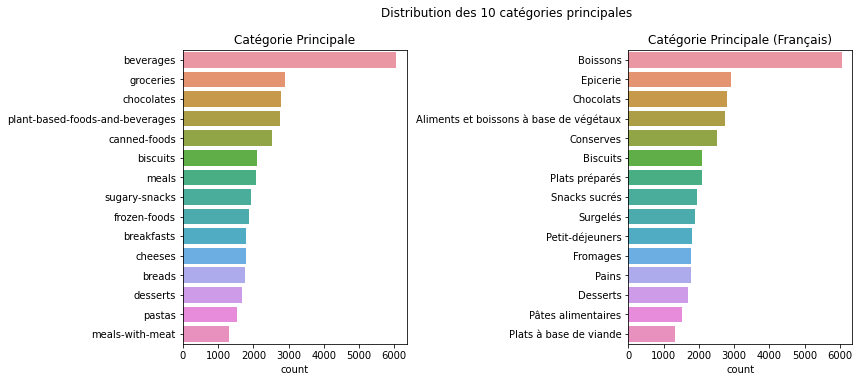

In [34]:
# Créer une figure avec deux sous-graphiques
fig, axs = plt.subplots(1, 2, figsize=(12, 6), sharey=False, gridspec_kw={'wspace': 0.99, 'hspace': 0.9})
plt.subplots_adjust(bottom=0.2)


# Obtenir les 10 catégories les plus fréquentes pour chaque colonne
top_10_main_category = df['main_category'].value_counts().nlargest(15).index
top_10_main_category_fr = df['main_category_fr'].value_counts().nlargest(15).index

# Créer un countplot pour la colonne main_category
sns.countplot(y='main_category', data=df[df['main_category'].isin(top_10_main_category)], order=top_10_main_category, ax=axs[0])
axs[0].set_title('Catégorie Principale')

# Créer un countplot pour la colonne main_category_fr
sns.countplot(y='main_category_fr', data=df[df['main_category_fr'].isin(top_10_main_category_fr)], order=top_10_main_category_fr, ax=axs[1])
axs[1].set_title('Catégorie Principale (Français)')

# Définir l'étiquette de l'axe y pour les deux sous-graphiques
axs[0].set_ylabel('')
axs[1].set_ylabel('')

# Définir le titre pour l'ensemble de la figure
plt.suptitle('Distribution des 10 catégories principales')
plt.show()



Après avoir tracé les distributions des deux colonnes de données 'main_category' et 'main_category_fr', nous avons constaté qu'elles sont identiques.

Pour comprendre la note nutritionnelle moyenne des produits contenus dans chaque groupe alimentaire, nous pouvons examiner le graphique ci-dessous.

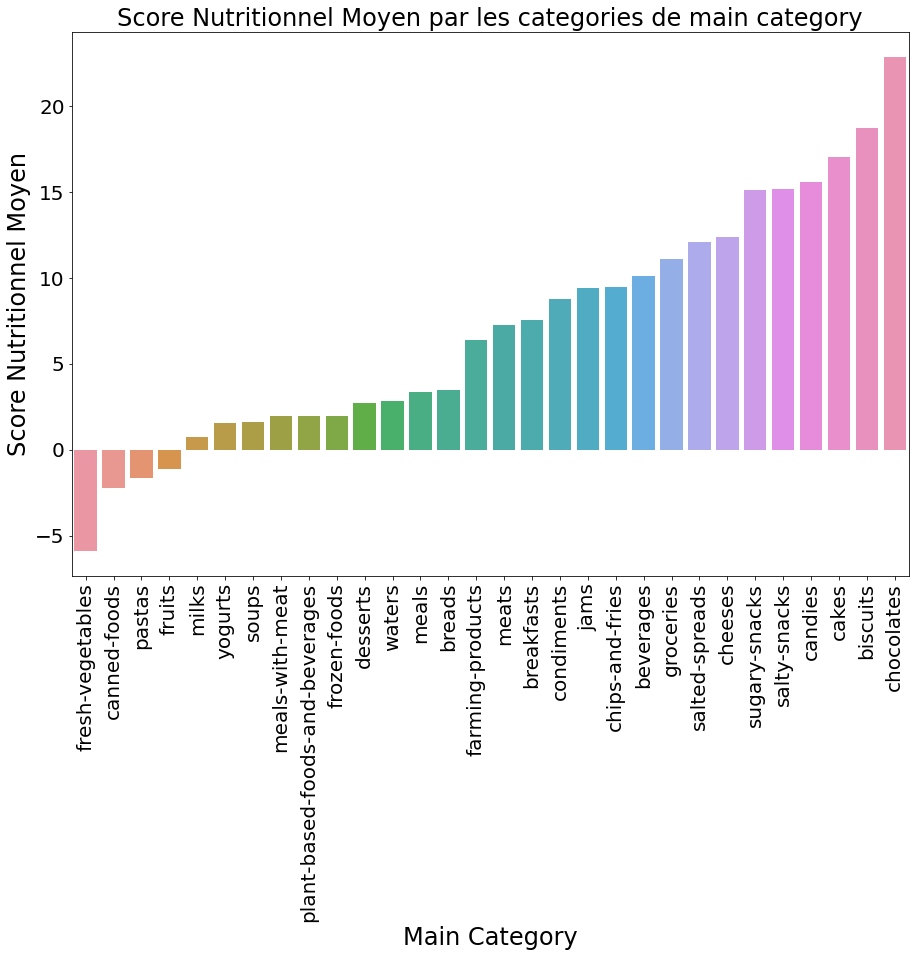

In [35]:
# Obtenir les 30 valeurs les plus fréquentes dans la colonne main category
top_categories = df['main_category'].value_counts().head(30).index.tolist()

# Regrouper la colonne main category par les catégories les plus populaires et calculer la moyenne de nutrition score
grouped_scores = df[df['main_category'].isin(top_categories)].groupby('main_category')['nutrition-score-fr_100g'].mean().sort_values()

# Tracer les scores groupés dans un graphique à barres

fig, ax = plt.subplots(figsize=(15,10))

sns.barplot(x=grouped_scores.index, y=grouped_scores.values)
ax.set_title('Score Nutritionnel Moyen par les categories de main category', fontsize=24)
ax.set_xlabel('Main Category', fontsize=24)
ax.set_ylabel('Score Nutritionnel Moyen', fontsize=24)
plt.xticks(rotation=90)
ax.tick_params(axis='both', which='major', labelsize=20)


plt.xticks(rotation=90)
plt.show()

Le graphique à barres ci-dessus montre la valeur nutritionnelle moyenne des 30 premiers aliments de la liste des principales catégories. Comme vous pouvez le constater, nous pouvons nous attendre à ce que les aliments les plus sains soient généralement associés à des chiffres bas, tandis que des chiffres plus élevés indiquent des produits moins sains, tels que les chocolats et les biscuits. De plus, ces valeurs moyennes sont différentes des autres. Cette analyse peut être utilisée pour estimer les valeurs nutritionnelles manquantes en se basant sur le nom de la catégorie alimentaire.

In [36]:
objects_cols = df.select_dtypes(include=['object']).columns
df[objects_cols[objects_cols.str.startswith('cat')]].dropna()

,categories,categories_tags,categories_fr
46,Filet de bœuf,fr:filet-de-boeuf,Filet-de-boeuf
174,Légumes-feuilles,"en:plant-based-foods-and-beverages,en:plant-based-foods,en:fresh-foods,en:fruits-and-vegetables-based-foods,en:fresh-plant-based-foods,en:vegetables-based-foods,en:fresh-vegetables,en:leaf-vegetables","Aliments et boissons à base de végétaux,Aliments d'origine végétale,Frais,Aliments à base de fruits et de légumes,Aliments à base de plantes frais,Légumes et dérivés,Légumes frais,Légumes-feuilles"
175,"Snacks sucrés,Biscuits et gâteaux,Pâtisseries","en:sugary-snacks,en:biscuits-and-cakes,en:pastries","Snacks sucrés,Biscuits et gâteaux,Pâtisseries"
177,"Plant-based foods and beverages,Plant-based foods,Cereals and potatoes,Breads","en:plant-based-foods-and-beverages,en:plant-based-foods,en:cereals-and-potatoes,en:breads","Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Pains"
180,"Snacks sucrés,Biscuits et gâteaux,Pâtisseries","en:sugary-snacks,en:biscuits-and-cakes,en:pastries","Snacks sucrés,Biscuits et gâteaux,Pâtisseries"
...,...,...,...
320762,pl:Szprot,pl:szprot,pl:Szprot
320763,thés verts,"en:plant-based-foods-and-beverages,en:beverages,en:hot-beverages,en:plant-based-beverages,en:herbal-teas,en:teas,en:green-teas,en:non-sugared-beverages","Aliments et boissons à base de végétaux,Boissons,Boissons chaudes,Boissons à base de végétaux,Infusions,Thés,Thés verts,Boissons non sucrées"
320765,"Viandes,Produits à tartiner,Charcuteries,Produits à tartiner salés,Rillettes,Rillettes de viande,Rillettes de viande blanche,Rillettes de volaille,Rillettes d'oie","en:meats,en:spreads,en:prepared-meats,en:salted-spreads,en:rillettes,en:potted-meats,en:white-meat-rillettes,fr:rillettes-de-volaille,fr:rillettes-d-oie","Viandes,Produits à tartiner,Charcuteries,Produits à tartiner salés,Rillettes,Rillettes de viande,Rillettes de viande blanche,Rillettes de volaille,Rillettes d'oie"
320766,Peanuts,"en:plant-based-foods-and-beverages,en:plant-based-foods,en:legumes-and-their-products,en:legumes,en:nuts-and-their-products,en:nuts,en:peanuts","Aliments et boissons à base de végétaux,Aliments d'origine végétale,Légumineuses et dérivés,Légumineuses,Fruits à coques et dérivés,Fruits à coques,Cacahuètes"


J'ai sélectionné les noms de colonnes qui commencent par 'cat' et je vais examiner comment ils sont similaires les uns aux autres.

In [37]:
df['categories_tags']=df['categories_tags'].apply(lambda x: x.split(':')[1] if (pd.notnull(x)) and (':' in x) else x)



In [38]:
df['categories_tags'].value_counts().head(24)

plant-based-foods-and-beverages,en    26596
sugary-snacks,en                      10452
beverages,en                           7037
dairies,en                             6387
meats,en                               4430
groceries,en                           3683
fresh-foods,en                         3490
salty-snacks,en                        1927
meals,en                               1876
spreads,en                             1839
canned-foods,en                        1671
seafood,en                             1420
frozen-foods,en                        1311
desserts,en                             979
sweeteners,en                           508
baby-foods,en                           482
sandwiches,en                           480
farming-products,en                     411
meals,fr                                401
breakfasts,en                           320
vinegars,en                             239
dried-products,en                       233
fish-and-meat-and-eggs,fr       

In [39]:
df['categories_tags']=df['categories_tags'].apply(lambda x: x.split(',')[0] if (pd.notnull(x)) and (',' in x) else x)

In [40]:
df['categories_fr'].value_counts()

Snacks sucrés,Biscuits et gâteaux,Biscuits                                                                                                                          801
Snacks sucrés,Chocolats,Chocolats noirs                                                                                                                             609
Snacks sucrés,Confiseries,Bonbons                                                                                                                                   526
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Petit-déjeuners,Céréales et pommes de terre,Céréales et dérivés,Céréales pour petit-déjeuner    521
Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat                                                                                                     465
                                                                                                                                                                

In [41]:
df['categories'].value_counts()

Snacks sucrés,Biscuits et gâteaux,Biscuits                                                                                                                                                                  300
Biscuits                                                                                                                                                                                                    287
Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat                                                                                                                                             247
Aliments et boissons à base de végétaux,Aliments d'origine végétale,Petit-déjeuners,Céréales et pommes de terre,Céréales et dérivés,Céréales pour petit-déjeuner                                            221
Bonbons                                                                                                                                                                 

Après avoir analysé les colonnes de données liées aux catégories, il a été constaté que les colonnes 'categories_fr', 'categories' et 'categories_tags' contiennent les mêmes informations. Les colonnes "categories" et "categories_fr" contiennent des termes mixtes à la fois détaillés et généralisés. En revanche, la colonne "categories_tags" semble contenir des données plus propres

In [42]:
df[df[objects_cols[objects_cols.str.startswith('label')]]
                   .notnull().any(axis=1)][objects_cols[objects_cols.str.startswith('label')]]

,labels,labels_tags,labels_fr
182,AB,"en:organic,en:eu-organic,fr:ab-agriculture-biologique","Bio,Bio européen,AB Agriculture Biologique"
184,Point Vert,en:green-dot,Point Vert
187,"Sans arômes artificiels,Contient des OGM","en:no-artificial-flavors,fr:contient-des-ogm","Sans arômes artificiels,Contient-des-ogm"
192,Incorrect data on label,en:incorrect-data-on-label,Informations incorrectes sur l'emballage
218,UTZ Certified Kakao,"en:sustainable-farming,en:utz-certified,en:utz-certified-cacao","Agriculture durable,UTZ Certified,UTZ Certified Cacao"
...,...,...,...
320751,"Bio,Bio européen,Sans gluten,AB Agriculture Biologique","en:organic,en:eu-organic,en:gluten-free,fr:ab-agriculture-biologique","Bio,Bio européen,Sans gluten,AB Agriculture Biologique"
320753,"Point vert,Déconseillé aux femmes enceintes","en:not-advised-for-specific-people,en:green-dot,en:not-advised-for-pregnant-women","Déconseillé à certaines catégories de personnes,Point Vert,Déconseillé aux femmes enceintes"
320757,"Organic, EU Organic, fr:AB Agriculture Biologique","en:organic,en:eu-organic,fr:ab-agriculture-biologique","Bio,Bio européen,AB Agriculture Biologique"
320761,AOC,fr:aoc,AOC


In [43]:
df['labels_tags']=df['labels_tags'].apply(lambda x: x.split(':')[1] if (pd.notnull(x)) and (':' in x) else x)


In [44]:
df['labels_fr'].value_counts()

Bio,Bio européen,AB Agriculture Biologique                                                                                                             5301
Point Vert                                                                                                                                             2453
Végétarien,Végétalien                                                                                                                                  1654
Point Vert,Eco-emballages                                                                                                                               834
Bio,Bio européen,FR-BIO-01,AB Agriculture Biologique                                                                                                    830
                                                                                                                                                       ... 
Pêche durable,Pêche durable MSC,Msc-sgs-nl-msc-c-0031           

In [45]:
df['labels'].value_counts()

Organic, EU Organic, fr:AB Agriculture Biologique                 3216
Point Vert                                                        2050
Vegetariano,Vegano                                                1048
Bio,Bio européen,AB Agriculture Biologique                         976
Point Vert,Eco-Emballages                                          608
                                                                  ... 
Depuis 1857,Info-Tri Point Vert                                      1
Info-Tri Point Vert,Cultivé & Produit en France,Origine France       1
No salt,No sugar,No proteines,No carbohydrates                       1
Cultivé & Produit en France                                          1
Dolphin friendly,Fished by pole & line,Recyclable steel              1
Name: labels, Length: 18104, dtype: int64

In [46]:
df['labels_tags'].value_counts()


organic,en                                 12699
vegetarian,en                               3283
green-dot                                   2453
green-dot,fr                                1917
low-or-no-sugar,en                          1490
                                           ...  
tomates-pelees-a-cru                           1
lait-collecte-en-mayenne                       1
garantie-viande-de-boeuf-origine-france        1
100-naturellement-gazeuse                      1
product-of-malaisia                            1
Name: labels_tags, Length: 2356, dtype: int64

In [47]:
df['labels_tags']=df['labels_tags'].apply(lambda x: x.split(',')[0] if (pd.notnull(x)) and (',' in x) else x)

De manière similaire, les colonnes portant le nom de "labels" suivent le même schéma, la colonne "labels_tags" ayant des données plus propres que les autres.





En bref, les noms de colonnes qui ont le même nom et se différencient par le suffixe ont été examinés et il a été constaté qu'ils incluent le même contexte de données, certains incluent des données plus propres, d'autres donnent la traduction en français. Cette différenciation pourrait nous aider à choisir quelle colonne sera utilisée pour le prochain notebook.

<a id='sec:Calculdelindiceecologique'></a>
# Calcul de l'indice écologique en fonction des pays et du type d'emballage

D'abord, nous devons corriger les données dans la colonne des pays. Notre objectif dans cette étude est d'examiner si les pays d'origine, de fabrication et de vente des produits sont cohérents. Cela nous permettra de déterminer combien de produits circulent dans le processus d'approvisionnement.

In [48]:
df['countries_tags']=df['countries_tags'].apply(lambda x: x.split(':')[1] if (pd.notnull(x)) and (':' in x) else x)
df['countries_tags']=df['countries_tags'].apply(lambda x: x.split(',')[0] if (isinstance(x, str) and ',' in x) else x)
df['countries_tags'].value_counts()

united-states                       172761
france                               97362
switzerland                          15034
germany                               8179
spain                                 5039
united-kingdom                        4861
belgium                               3445
australia                             2149
russia                                1319
italy                                 1239
canada                                 954
portugal                               712
netherlands                            563
austria                                438
denmark                                385
brazil                                 340
czech-republic                         292
hungary                                254
thailand                               241
romania                                210
ireland                                189
china                                  186
japan                                  179
luxembourg 

Dans ce graphique, vous pouvez voir la carte géologique qui répartit le nombre de noms de pays sur la liste des pays.

In [49]:
country_counts = df['countries_tags'].value_counts().reset_index()
country_counts.columns = ['country', 'count']

country_counts = country_counts.query('count >= 2')



dataPlot = dict(
    type='choropleth',
    locations=country_counts['country'],
    locationmode="country names",
    z=country_counts['count'],
    text=country_counts['country'],
    marker=dict(line=dict(color='rgb(255,255,255)', width=1)),
    colorbar={'title': 'Count'},
    colorscale='YlOrRd',
    autocolorscale=False,
    reversescale=True,
    showscale=True,
    zmin=0,
    zmax=200000,
)

layout = dict(
    title='Number of products by country',
    geo=dict(
        showframe=False,
        projection={'type': 'equirectangular'},
    ),
)

choromap = go.Figure(data=[dataPlot], layout=layout)
choromap.update_layout(height=500, margin={"r":0,"t":0,"l":0,"b":0})
choromap.show()

La plupart des produits dans ce jeu de données sont vendus aux États-Unis et en France. Les autres pays représentent une proportion moins importante. Après la France, les pays d'Europe de l'Ouest sont les plus représentés.

Dans les colonnes origins_tags et manufacturing_places_tags, il y a de nombreux noms de pays en différentes langues, en particulier en français. La colonne countries_tag est plus régulière et en anglais. C'est pourquoi les noms de pays erronés et en différentes langues dans ces deux colonnes ont été remplacés de manière appropriée pour pouvoir les faire correspondre.

In [50]:
df['origins_tags'].replace({'deutschland': 'germany',
                            'italie': 'italy',
                            'italien': 'italy',
                            'italia': 'italy',
                            'belgique': 'belgium',
                            'suisse': 'switzerland',
                            'allemagne': 'germany',
                            'alemania': 'germany',
                            'espagne': 'spain',
                            'espana': 'spain',
                            'royaume-uni': 'united-kingdom',
                            'frankreich': 'france',
                            'thailande': 'thailand',
                            'pays-bas': 'netherlands',
                            'maroc': 'morocco',
                            'angleterre': 'united-kingdom',
                            'turquie': 'turkey',
                            'union-europeenne': 'eu',
                            'quebec':'canada',
                            'grande-bretagne':'united-kingdom',
                            'uk':'united-kingdom',
                            'usa':'united-states'}, inplace=True)

df['manufacturing_places_tags'].replace({'deutschland': 'germany',
                                          'italie': 'italy',
                                          'italien': 'italy',
                                          'italia': 'italy',
                                          'belgique': 'belgium',
                                          'suisse': 'switzerland',
                                          'allemagne': 'germany',
                                          'alemania': 'germany',
                                          'espagne': 'spain',
                                          'espana': 'spain',
                                          'royaume-uni': 'united-kingdom',
                                          'frankreich': 'france',
                                          'thailande': 'thailand',
                                          'pays-bas': 'netherlands',
                                          'maroc': 'morocco',
                                          'angleterre': 'united-kingdom',
                                          'turquie': 'turkey',
                                          'union-europeenne': 'eu',
                                          'brossard-quebec':'canada',
                                          'brossard,quebec':'canada',
                                          'grande-bretagne':'united-kingdom',
                                          'uk':'united-kingdom',
                                          'usa':'united-states'}, inplace=True)

Dans ce code ci-dessous, on a utilisé SequenceMatcher pour mesurer la similarité entre les pays et les pays dans les colonnes origin_tag et manufacturing_place_tag. La similarité entre les deux paires de chaînes de texte a été mesurée et leur moyenne a été calculée. Certains noms de pays sont longs dans origin_tag et incluent des noms de villes ou de districts. Par conséquent, des chaînes de texte contenant des virgules ont été examinées de plus près et toutes les chaînes ont été comparées aux noms de pays des autres colonnes.

In [51]:
#Importer la bibliothèque "SequenceMatcher"
from difflib import SequenceMatcher

# Définir une fonction pour calculer les scores de similarité
def similarity_score(s1, s2):
    # Vérifier si l'une des chaînes est nulle ou non, si oui, renvoyer 0
    if type(s1) == float or type(s2) == float:
        return 0
    else:
        # Séparer les chaînes en utilisant la virgule comme séparateur
        s1_split = s1.split(',') if ',' in s1 else [s1]
        s2_split = s2.split(',') if ',' in s2 else [s2]
        # Calculer les scores de similarité entre chaque paire de sous-chaînes
        similarity_scores = []
        for x in s1_split:
            for y in s2_split:
                similarity_scores.append(SequenceMatcher(None, x, y).ratio())
          # Renvoyer le score de similarité maximal
    return max(similarity_scores)

# Calculer les scores de similarité pour chaque ligne
similarity_scores = []
for index, row in df.iterrows():
    origins = row['origins_tags']
    manufacturing_places = row['manufacturing_places_tags']
    countries = row['countries_tags']
# Calculer les scores de similarité entre "origins_tags" et "manufacturing_places_tags"
    origins_to_manufacturing = similarity_score(origins, manufacturing_places)

# Calculer les scores de similarité entre "origins_tags" et "countries_tags"
    origins_to_countries = similarity_score(origins, countries)

# Calculer les scores de similarité entre "manufacturing_places_tags" et "countries_tags"
    manufacturing_to_countries = similarity_score(manufacturing_places, countries)

# Calculer la similarité moyenne des trois scores de similarité
    average_similarity = (origins_to_manufacturing + origins_to_countries + manufacturing_to_countries) / 3
    similarity_scores.append(average_similarity)


# Ajouter la colonne des scores de similarité au DataFrame
df['similarity_score'] = similarity_scores

# Afficher le DataFrame avec la colonne des scores de similarité
display(df[['origins_tags', 'manufacturing_places_tags', 'countries_tags', 'similarity_score']].dropna().head(50))


,origins_tags,manufacturing_places_tags,countries_tags,similarity_score
174,canada,canada,canada,1.000000
175,canada,canada,canada,1.000000
177,france,united-kingdom,united-kingdom,0.466667
180,canada,canada,canada,1.000000
181,canada,canada,canada,1.000000
185,canada,canada,canada,1.000000
186,canada,canada,canada,1.000000
267,germany,germany,germany,1.000000
268,germany,germany,germany,1.000000
274,germany,germany,germany,1.000000


Après cela, nous avons créé une nouvelle colonne appelée "environmental_score" et l'avons remplie avec des valeurs NaN. Nous avons filtré les lignes avec des valeurs nulles ou zéro dans les colonnes pertinentes. Nous avons ensuite calculé le score écologique en fonction du score de similarité. 
En utilisant cette méthode, nous avons remarqué que les produits étiquetés en France, en Australie, en Allemagne et au Royaume-Uni ont des scores environnementaux plus élevés que les autres produits.

In [52]:
# Créer une nouvelle colonne appelée "score écologique" et la remplir de valeurs NaN
df["environmental_score"] = np.nan

# Filtrer les lignes avec des valeurs nulles ou nulles dans les colonnes pertinentes
mask = ~(df["origins_tags"].isna() | df["manufacturing_places_tags"].isna() | df["countries_tags"].isna() |
         df["origins_tags"].eq("") | df["manufacturing_places_tags"].eq("") | df["countries_tags"].eq("") |
         df["similarity_score"].isna())

# Calculer le score écologique en fonction du score de similitude
df.loc[mask, "environmental_score"] = (df.loc[mask, "similarity_score"] / df.loc[mask, "similarity_score"].max()) * 100

# Arrondir les scores à deux décimales et les convertir en entiers
df.loc[mask, "environmental_score"] = df.loc[mask, "environmental_score"].round(2).astype(int)

# Afficher les 10 premières lignes par score écologique
display(df[["origins_tags", "manufacturing_places_tags", "countries_tags", "similarity_score", "environmental_score"]]
.sort_values(by="environmental_score", ascending=False).value_counts().head(10))


origins_tags                manufacturing_places_tags  countries_tags  similarity_score  environmental_score
france                      france                     france          1.000000          100.0                  2031
australia                   australia                  australia       1.000000          100.0                   404
eu                          france                     france          0.500000          50.0                    205
germany                     germany                    germany         1.000000          100.0                   142
italy                       italy                      france          0.454545          45.0                    135
united-kingdom              united-kingdom             united-kingdom  1.000000          100.0                   118
china                       china                      australia       0.523810          52.0                     90
spain                       spain                      france          0

In [53]:
df['environmental_score'].iplot(kind='hist')